In [1]:
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np
import pathlib
import re
import tqdm

In [2]:
paths = pathlib.Path('Dataset').glob('*')
paths = sorted([x for x in paths])

In [3]:
image = plt.imread(str(paths[0]))
image.shape

(1575, 2100, 3)

In [4]:
def Braley_binarisation(image, s=-1, t=0.15): 
    
    height = image.shape[0]  
    width = image.shape[1]
    if s == -1:
        s = width//8;
    s2 = s//2
    grey_pix =  0.2125*image[:,:,0] + 0.7154*image[:,:,1] + 0.0721*image[:,:,2]
    integral_image = np.zeros_like(grey_pix)
    for i in range(width):
        sum = 0
        for j in range(height):
            sum += grey_pix[j][i]
            if (i==0):
                integral_image[j][i] = sum
            else:
                integral_image[j][i] = integral_image[j][i-1] + sum
            
    res = np.zeros_like(grey_pix)     
    for i in range(width):
        for j in range(height):
            x1=max(i-s2, 0)
            x2=min(i+s2, width-1)
            y1=max(j-s2, 0)
            y2=min(j+s2, height-1)
            count = (x2-x1)*(y2-y1)
            sum = integral_image[y2][x2]-integral_image[y1][x2]-integral_image[y2][x1]+integral_image[y1][x1]
            if grey_pix[j][i]*count < sum*(1.0-t):
                res[j][i] = 0
            else:
                res[j][i] = 255
                
    return res

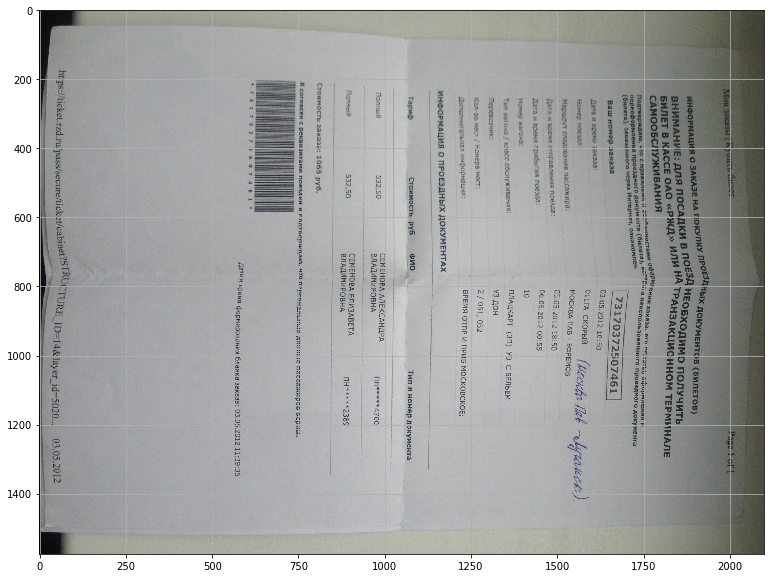

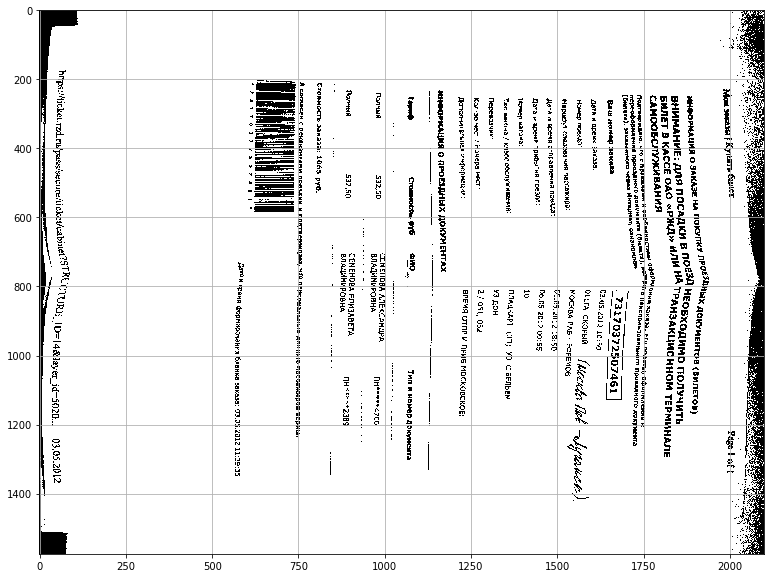

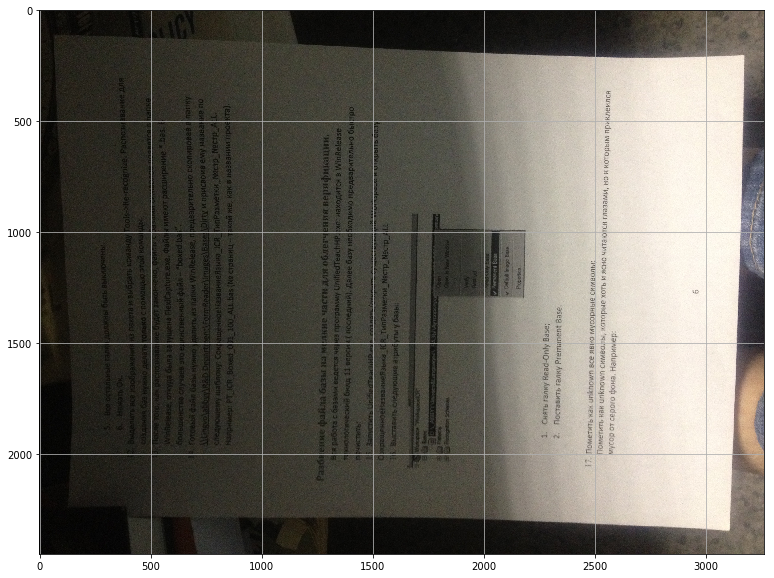

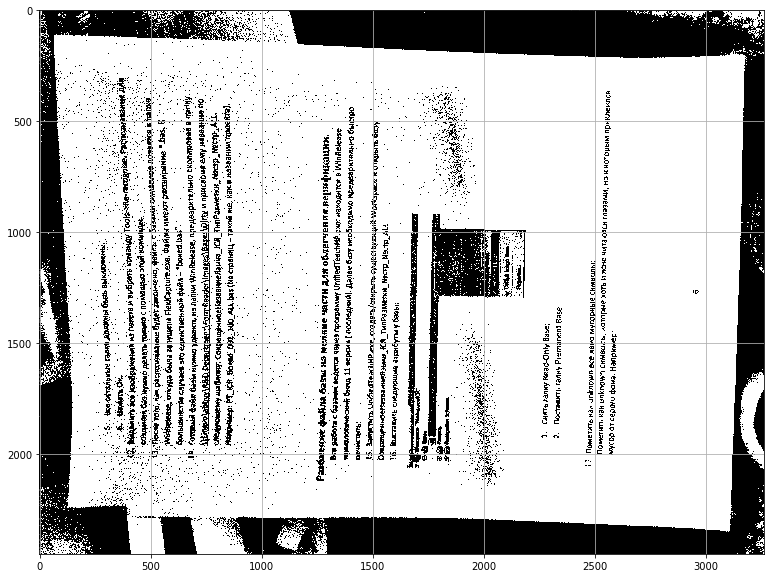

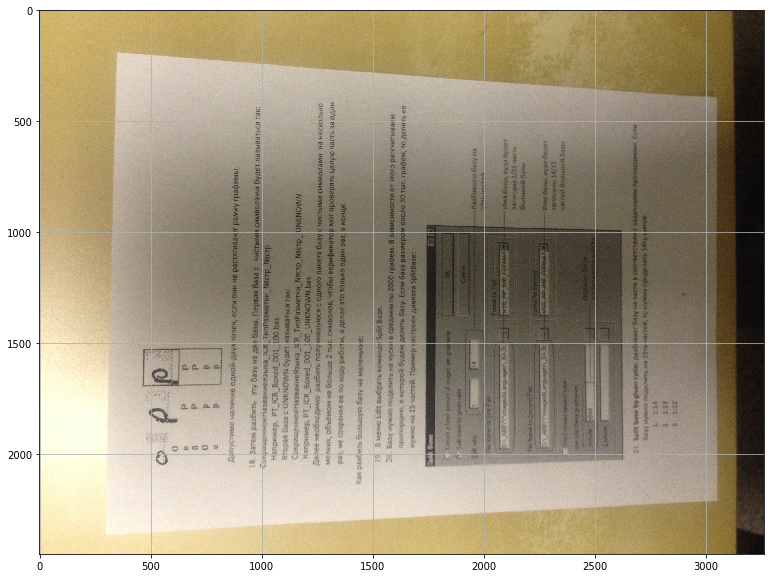

...

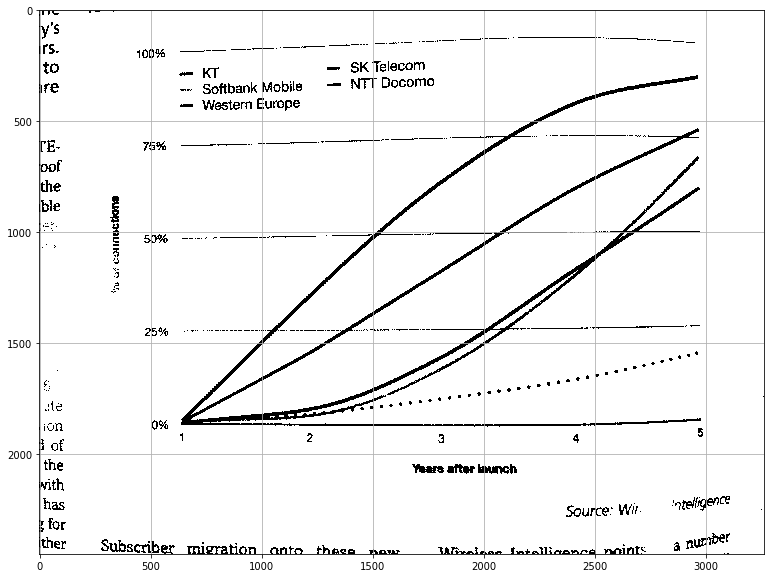

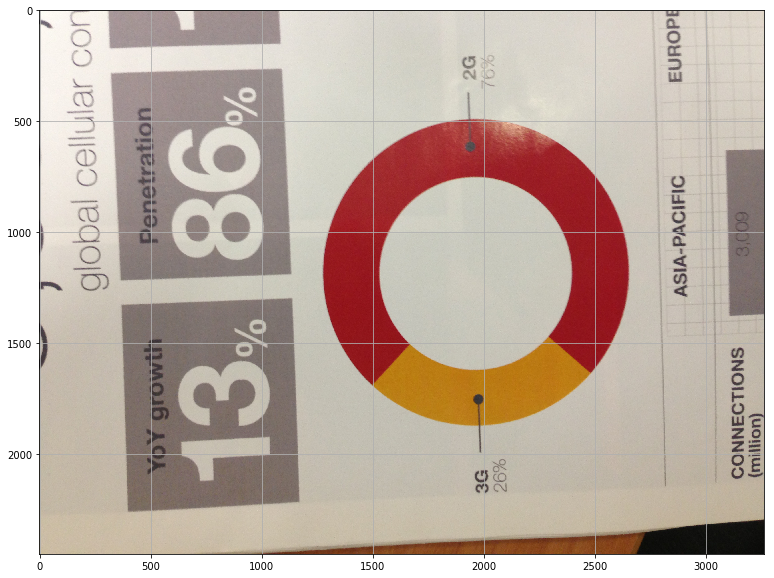

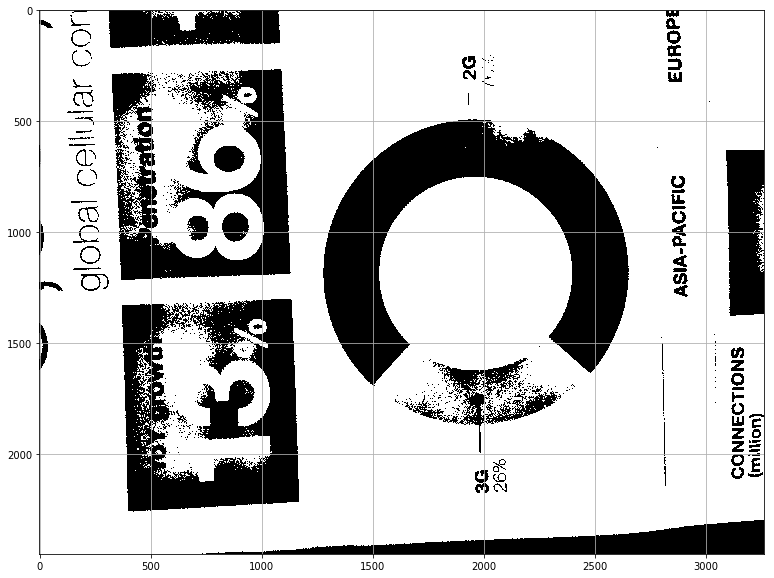

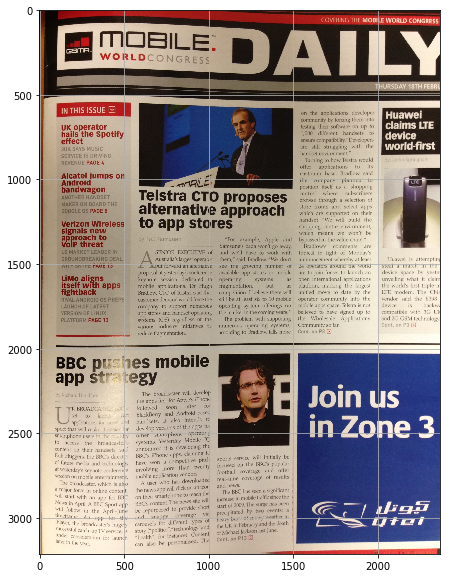

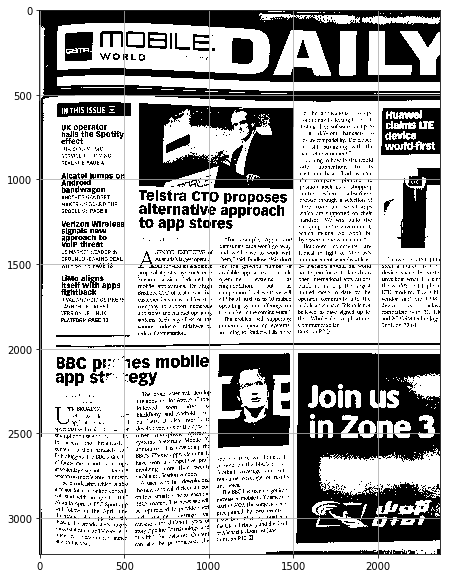

In [5]:
for path in tqdm.tqdm_notebook(paths):
    image = plt.imread(str(path))
    res = Braley_binarisation(image)
    plt.figure(figsize=(17,10))
    plt.grid()
    plt.imshow(image, cmap=plt.cm.gray)
    plt.show()
    plt.figure(figsize=(17,10))
    plt.grid()
    plt.imshow(res, cmap=plt.cm.gray)
    plt.show()
    plt.imsave('res/image' + re.findall(r'Dataset/(\w+).', str(path))[0] + '.png', res, cmap=plt.cm.gray)

In [6]:
%%time

for path in tqdm.tqdm_notebook(paths):
    image = plt.imread(str(path))
    res = Braley_binarisation(image)


CPU times: user 9min 52s, sys: 1.23 s, total: 9min 53s
Wall time: 9min 42s


# Результаты

Проблемы возникают с текстом на слишком темном фоне, на засвеченных участках. Это можно попробовать решить с помощью подбора параметра t. 

Время работы (9\*60+42)/(15\*1575\*2100)\*10^6, что приблизительно равно 10 сек/мегапиксель.